In [2]:
import numpy as np
import pandas as pd
import nltk
import random
import pandas as pd
import matplotlib as mpl
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import datetime 
import calendar

In [3]:
df = pd.read_csv("../CODE/netflix_cleaned_data.csv")

In [3]:
df.head()

,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,category,description,month,day
0,s1,TV Show,3%,Unavailable,"João Miguel, Bianca Comparato, Michel Gomes, R...",Brazil,2020-08-14,2020,TV-MA,4 Seasons,"International TV Shows, TV Dramas, TV Sci-Fi &...",In a future where the elite inhabit an island ...,August,Friday
1,s2,Movie,7:19,Jorge Michel Grau,"Demián Bichir, Héctor Bonilla, Oscar Serrano, ...",Mexico,2016-12-23,2016,TV-MA,93 min,"Dramas, International Movies",After a devastating earthquake hits Mexico Cit...,December,Friday
2,s3,Movie,23:59,Gilbert Chan,"Tedd Chan, Stella Chung, Henley Hii, Lawrence ...",Singapore,2018-12-20,2011,R,78 min,"Horror Movies, International Movies","When an army recruit is found dead, his fellow...",December,Thursday
3,s4,Movie,9,Shane Acker,"Elijah Wood, John C. Reilly, Jennifer Connelly...",United States,2017-11-16,2009,PG-13,80 min,"Action & Adventure, Independent Movies, Sci-Fi...","In a postapocalyptic world, rag-doll robots hi...",November,Thursday
4,s5,Movie,21,Robert Luketic,"Jim Sturgess, Kevin Spacey, Kate Bosworth, Aar...",United States,2020-01-01,2008,PG-13,123 min,Dramas,A brilliant group of students become card-coun...,January,Wednesday


# Question 1
### Movies Vs Series Distribution:

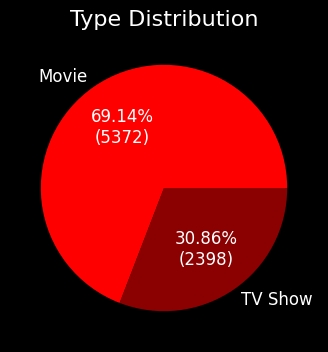

In [4]:
types = df.groupby('type').size()

fig, ax = plt.subplots(figsize=(4,4),facecolor='black')
types.plot.pie(ax=ax, colors=['red', 'darkred'], textprops={'fontsize': 12, 'color': 'w'}, autopct=lambda p: '{:.2f}%\n({:.0f})'.format(p, (p/100)*types.sum()))
plt.title('Type Distribution', fontsize=16, color='white')
plt.show()

This shows number of Movies are more than TV Shows with proportion as 7:3.

# Question 2
### Movies Vs Series Distribution Over the Years:

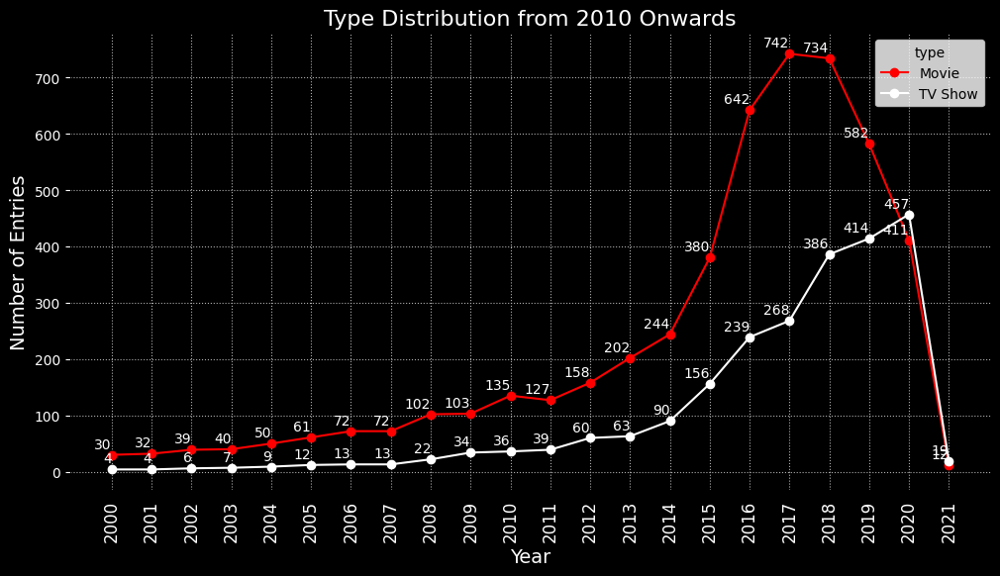

In [5]:
fig, ax = plt.subplots(figsize=(12, 6),facecolor='black')

df_filtered = df[df['release_year'] >= 2000]
df_group = df_filtered.groupby(['release_year', 'type']).size().unstack().fillna(0)  
df_group.plot.line(ax=ax, color=['red', 'white'], marker='o')

plt.title('Type Distribution from 2010 Onwards', fontsize=16, color='white')
plt.xlabel('Year', fontsize=14, color='white')
plt.ylabel('Number of Entries', fontsize=14, color='white')
plt.grid(True,linestyle='dotted')

ax.set_facecolor('black')
ax.tick_params(axis='y', colors='white')
years = np.arange(df_group.index.min(), df_group.index.max() + 1)  
plt.xticks(years, rotation=90, fontsize=12, color='white')

for line in ax.lines:
    for x, y in zip(line.get_xdata(), line.get_ydata()):
        label = "{:.0f}".format(y)
        ax.annotate(label, (x, y), textcoords="offset points", xytext=(0,5), ha='right', color='white')
plt.show()


In recent years, Netflix has invested more in movies than TV Shows.

# Question 3
### Movies Vs Series Distribution by months:

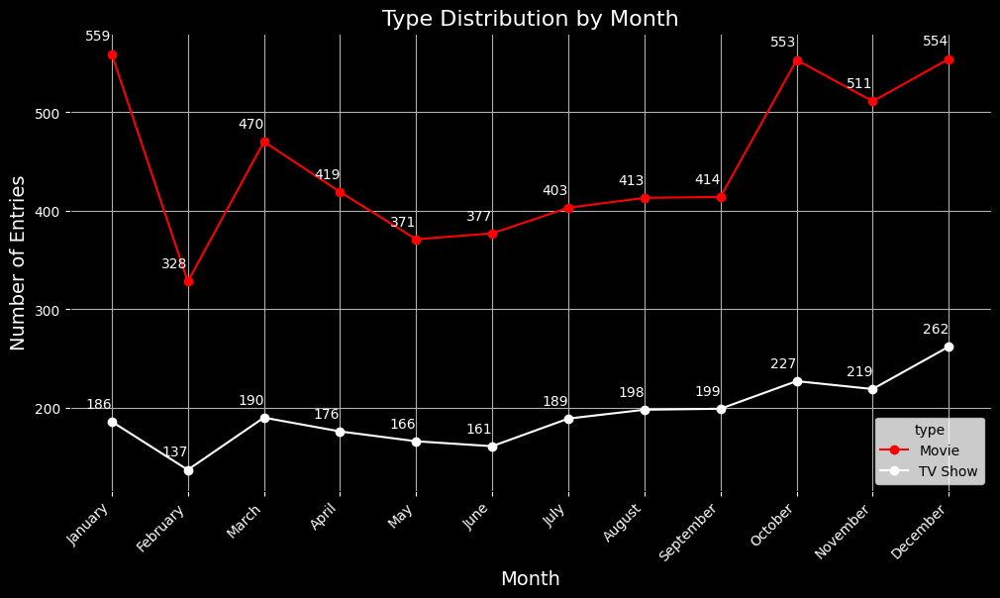

In [6]:
month_order = ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December']

fig, ax = plt.subplots(figsize=(12, 6))
df_group = df.groupby(['month', 'type']).size().unstack().fillna(0)  

df_group = df_group.reindex(month_order, axis=0)
df_group.plot.line(ax=ax, color=['red', 'white'], marker='o')

plt.title('Type Distribution by Month', fontsize=16, color='white')
plt.xlabel('Month', fontsize=14, color='white')
plt.ylabel('Number of Entries', fontsize=14, color='white')
plt.grid(True)

fig.patch.set_facecolor('black')
ax.set_facecolor('black')

ax.tick_params(axis='x', colors='white')
ax.tick_params(axis='y', colors='white')
ax.set_xticks(range(len(month_order)))
ax.set_xticklabels(month_order, rotation=45, ha='right', color='white')

for line in ax.lines:
    for x, y in zip(line.get_xdata(), line.get_ydata()):
        label = "{:.0f}".format(y)
        ax.annotate(label, (x, y), textcoords="offset points", xytext=(0,10), ha='right', color='white')
plt.show()

The chart shows Movies & TV Shows distribution by month, with peak in month of january and then follows an up-down trend to december. 

# Question 4
### Which country has the most content (movies or series)?

### Countries with most Movies:

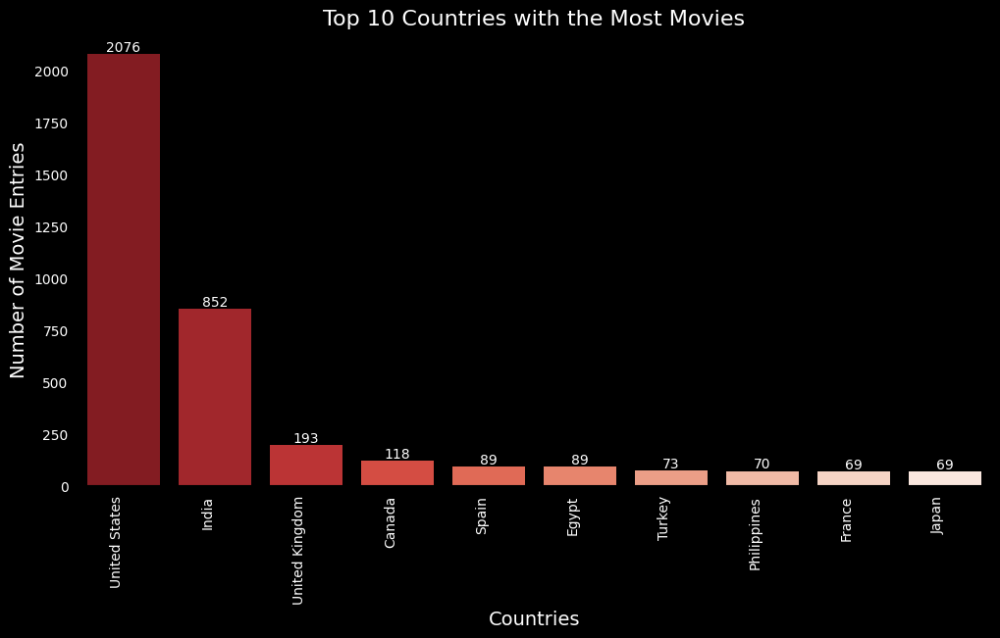

In [19]:
movie_df = df[df['type'] == 'Movie']
country_counts = movie_df['country'].value_counts().head(10)

plt.figure(figsize=(12, 6), facecolor='black')
ax = sns.barplot(x=country_counts.index, y=country_counts.values, hue=country_counts.index, palette='Reds_r')
plt.title('Top 10 Countries with the Most Movies', fontsize=16, color='white')
plt.xlabel('Countries', fontsize=14, color='white')
plt.ylabel('Number of Movie Entries', fontsize=14, color='white')

plt.xticks(rotation=90, ha='right', color='white')
plt.yticks(ha='right', color='white')
plt.gca().set_facecolor('black')

for i, count in enumerate(country_counts):
    plt.text(i, count, str(count), ha='center', va='bottom', color='white')
plt.show()

As the chart shows, United States is leading producer of Movies with count of 2076, followed by India with 852 movies. And after that count of movies decreases continiously.

### Countries with most TV Shows:

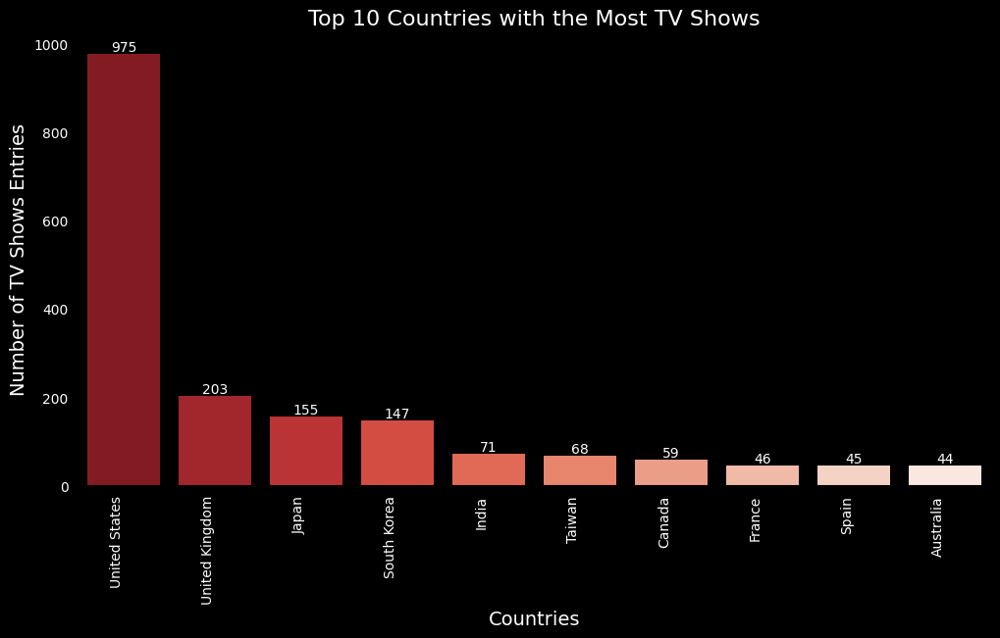

In [8]:
tvshow_df = df[df['type'] == 'TV Show']
country_counts = tvshow_df['country'].value_counts().head(10)

plt.figure(figsize=(12, 6), facecolor='black')
ax = sns.barplot(x=country_counts.index, y=country_counts.values, hue=country_counts.index, palette='Reds_r', legend=False)

plt.title('Top 10 Countries with the Most TV Shows', fontsize=16, color='white')
plt.xlabel('Countries', fontsize=14, color='white')
plt.ylabel('Number of TV Shows Entries', fontsize=14, color='white')

plt.xticks(rotation=90, ha='right', color='white')
plt.yticks(ha='right', color='white')
plt.gca().set_facecolor('black')

for i, count in enumerate(country_counts):
    plt.text(i, count, str(count), ha='center', va='bottom', color='white')
plt.show()

As the chart shows, United States is leading producer of Tv Shows with count of 973, followed by United Kingdom with 203 movies. And after that count of shows decreases continiously.

# Question 5
### The Graphs showing the actors with the most Movies/TV Shows in each country:

In [9]:
#Filter Country & Cast data.
df_flt = df[~df.country.isna() & ~df.cast.isna()]
df_flt = df_flt.assign(country=df_flt['country'].str.strip(',').str.replace(', ', ',').str.split(',')).explode('country').reset_index(drop=True)
df_flt = df_flt.assign(cast=df_flt['cast'].str.strip().str.split(', ')).explode('cast').reset_index(drop=True)

## For movies
### Τhe top 5 actors with the most movies in each country.

In [10]:
df_movie = df_flt[(df_flt['type'] == 'Movie')]
df_movie = df_movie[df_movie['cast'] != 'Unavailable']
countries_with_movies = df_movie['country'].value_counts().keys().tolist()

fig = plt.figure(figsize=(25, 400))
fig.patch.set_facecolor('black')  
for idx, country in enumerate(countries_with_movies):
    ax = fig.add_subplot(40, 3, idx + 1)    
    
    result = df_movie.loc[df_movie['country'] == country, 'cast'].value_counts().sort_values().tail(5)
    result.plot.bar(color=sns.color_palette("Reds_r", n_colors=5), rot=0)

    ax.set_title(country, fontsize=16, color='white')  
    ax.tick_params(axis='x', labelrotation=20,labelsize=16, colors='white')
    ax.set_xlabel('Actors', fontsize=16, color='white')
    ax.tick_params(axis='y',labelsize=16, colors='white')
    
    ax.set_facecolor('black')
    for spine in ax.spines.values():
        spine.set_edgecolor('white')
    
plt.subplots_adjust(hspace=0.5)
plt.show()

## For series
### The top 5 actors with the most series in each country:

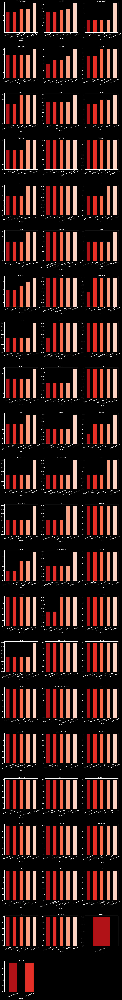

In [11]:
df_series = df_flt[(df_flt['type'] == 'TV Show')]
df_series = df_series[df_series['cast'] != 'Unavailable']
countries_with_series = df_series['country'].value_counts().keys().tolist()

fig = plt.figure(figsize=(25, 400))
fig.patch.set_facecolor('black')

for idx, country in enumerate(countries_with_series):
    ax = fig.add_subplot(40, 3, idx + 1)    
    result = df_series.loc[df_series['country'] == country, 'cast'].value_counts().sort_values().tail(5)
    result.plot.bar(color=sns.color_palette("Reds_r", n_colors=5), rot=0)
    ax.set_title(country, fontsize=16, color='white')  
    ax.tick_params(axis='x', labelrotation=20, labelsize=16, colors='white')  
    ax.set_xlabel('Actors', fontsize=16, color='white')
    ax.tick_params(axis='y',labelsize=16, colors='white')  
    
    ax.set_facecolor('black')
    for spine in ax.spines.values():
        spine.set_edgecolor('white')

plt.subplots_adjust(hspace=0.5)
plt.show()

# Question 6
### The number of movies/tv shows depending on the suggested age.

C:\Users\RADHA\AppData\Local\Temp\ipykernel_6400\1832408569.py:13: UserWarning: To output multiple subplots, the figure containing the passed axes is being cleared.
  df_group.plot.pie(subplots=True,ax=ax,legend=True,autopct='%1.1f%%',


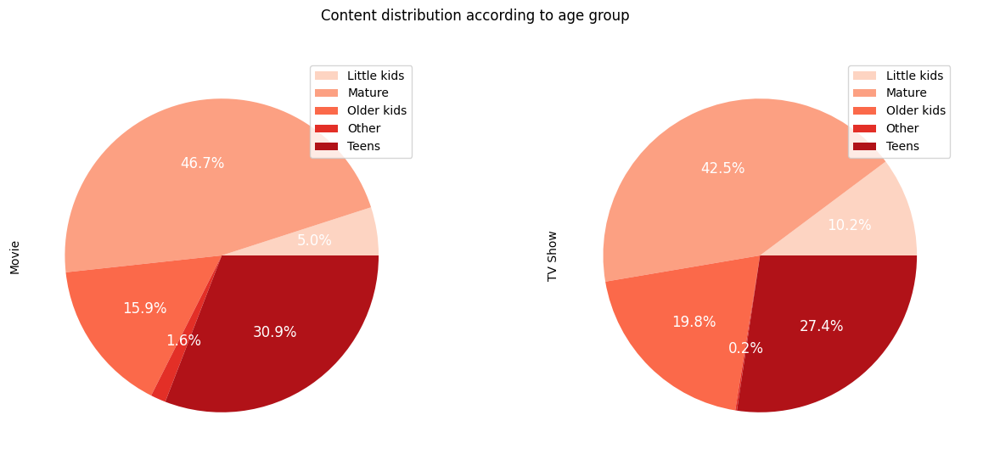

In [15]:
little_kids = ['G', 'TV-Y', 'TV-G']
older_kids = ['PG', 'TV-Y7', 'TV-Y7-FV', 'TV-PG']
teens = ['PG-13', 'TV-14']
mature = ['R', 'NC-17', 'TV-MA']
rating_list = [little_kids, older_kids, teens, mature]
rating_names = ['Little kids', 'Older kids', 'Teens', 'Mature']

df_fltr = df[~df['rating'].isna()]
age_group = np.select([df_fltr['rating'].isin(categ) for categ in rating_list],rating_names,'Other')
df_group = df_fltr.groupby([age_group,'type']).size().unstack(fill_value = 0)

fig, ax = plt.subplots(figsize=(15, 6))
df_group.plot.pie(subplots=True,ax=ax,legend=True,autopct='%1.1f%%',
                  textprops={'fontsize': 12,'color':'white'},
                  title=('Content distribution according to age group'),
                  colors=sns.color_palette("Reds", n_colors=5))
plt.show()

Based on the graphs, Netflix does not provide rich content for all ages, because of the small percentage of content for Little kids and Older kids, both for Movie and TV Show type of content.

# Question 7
### Top Movie Rating of Movies:

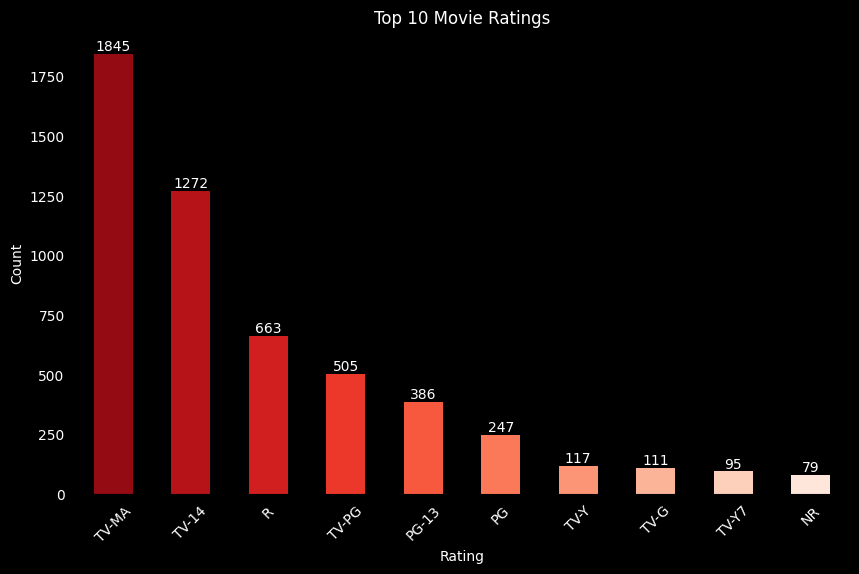

In [17]:
top_10_rating_movie = df[df['type'] == 'Movie']['rating'].value_counts().sort_values(ascending=False).iloc[:10]

plt.figure(figsize=(10, 6), facecolor='black')  
top_10_rating_movie.plot(kind='bar', color=sns.color_palette('Reds_r', len(top_10_rating_movie)))  

plt.title('Top 10 Movie Ratings', color='white') 
plt.xlabel('Rating', color='white')  
plt.ylabel('Count', color='white')  
plt.xticks(rotation=45, color='white')  
plt.yticks(color='white')  
plt.gca().set_facecolor('black')

for i, count in enumerate(top_10_rating_movie):
    plt.text(i, count, str(count), ha='center', va='bottom', color='white')
plt.show()

The Movie with TV-MA rating are higher in number, followed by 'TV-14' rating on 2nd place and then rating count decreases further from 'R' rated movies with 663 count to 'NR' rated movies on 10th rank with 79 count.

### Top Movie Rating of TV Shows:

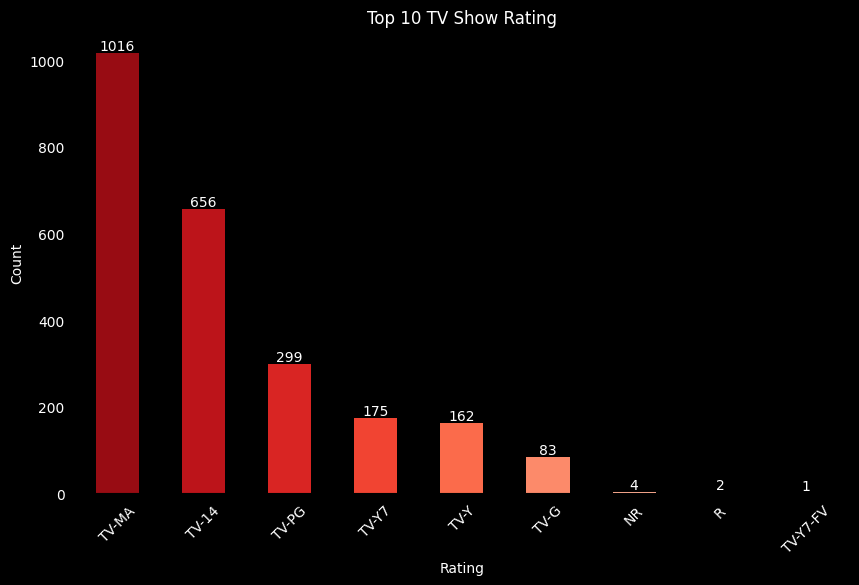

In [47]:
top_10_rating_TV_Show = df[df['type'] == 'TV Show']['rating'].value_counts().sort_values(ascending=False).iloc[:10]

plt.figure(figsize=(10, 6), facecolor='black')  
top_10_rating_TV_Show.plot(kind='bar', color=sns.color_palette('Reds_r', len(top_10_rating_TV_Show)))  

plt.title('Top 10 TV Show Rating', color='white') 
plt.xlabel('Rating', color='white')  
plt.ylabel('Count', color='white')  
plt.xticks(rotation=45, color='white')  
plt.yticks(color='white')  
plt.gca().set_facecolor('black')

for i, count in enumerate(top_10_rating_TV_Show):
    plt.text(i, count, str(count), ha='center', va='bottom', color='white')
plt.show()

The Tv Shows with TV-MA rating are higher in number, followed by 'TV-14' rating on 2nd place and then rating count decreases further from 'TV-PG' rated movies with 299 on 3rd place count to 'TV-Y7-FV' rated movies on lastw with 1 count only.

# Question 8
### Content (genre) Distribution by country:

In [21]:
tempdf = df
new_tempdf = tempdf.assign(country=tempdf['country'].str.strip(',').str.replace(', ', ',').str.split(',')).explode('country').reset_index()
tempdf =  new_tempdf.assign(category=new_tempdf['category'].str.strip(',').str.replace(', ', ',').str.split(',')).explode('category').reset_index(drop=True)

tempdf = tempdf.groupby(['country','category']).size().unstack()
fig = plt.figure(figsize=(25, 400), facecolor="black")
i = 1
for country, row in tempdf.iterrows():
    row = row.dropna()
    ax = fig.add_subplot(40, 3, i)
    sns.barplot(x=row.index, y=row.values, hue=row.index, palette="Reds_r", ax=ax)
    
    ax.set_title(country, fontsize=16, color='white')  
    ax.set_xlabel('Movie Genres',fontsize=15, color='white')  
    ax.set_xticks(range(len(row.index)))  
    ax.set_xticklabels(row.index, rotation=90,fontsize=15, color='white') 
    
    ax.set_yticks(ax.get_yticks())
    ax.set_ylabel('Count',fontsize=16, color='white')
    ax.set_yticklabels(['{:.2f}'.format(y) for y in ax.get_yticks()],fontsize=16, color='white')  
    ax.set_facecolor('black') 
    i += 1
    
    for spine in ax.spines.values():
        spine.set_edgecolor('white')
plt.subplots_adjust(hspace=1)
plt.show()

# Question 9
### Genre Distribution:

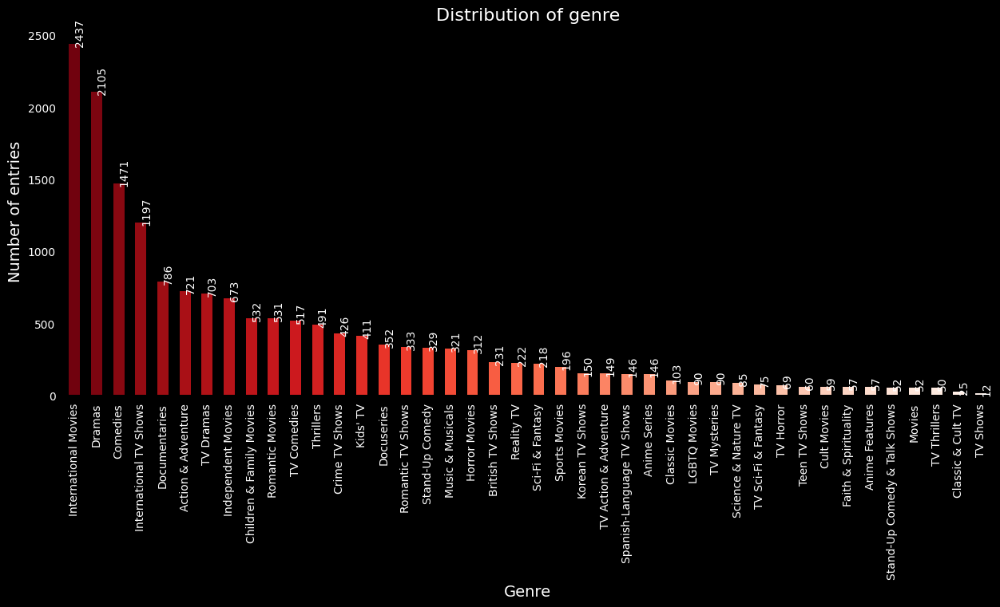

In [13]:
df_fltr = df[~df['category'].isna()]
df_new = df_fltr.assign(category=df_fltr['category'].str.strip().str.split(', ')).explode('category').reset_index(drop=True)

df_group = df_new.groupby('category').size().sort_values(ascending=False)
plt.figure(figsize=(12, 6),facecolor='black')
df_group.plot.bar(figsize=(15, 6),color=sns.color_palette("Reds_r",len(df_group)))
for index, value in enumerate(list(df_group)):
    plt.text(index, value, str(value),rotation=90,color='white')
plt.title('Distribution of genre', fontsize=16,color='white')
plt.xlabel('Genre', fontsize=14,color='white')
plt.ylabel('Number of entries', fontsize=14,color='white')
plt.xticks(rotation=90, color='white')  
plt.yticks(color='white') 
plt.gca().set_facecolor('black')
plt.show()

This chart shows Genre as 'International-Movies' & 'Dramas' are most in number with count of 2437 & 2105, then count decreases further from Genere 'Comedies' to 'TV Shows' at last.

# Question 10
### Top Genres of Movies:

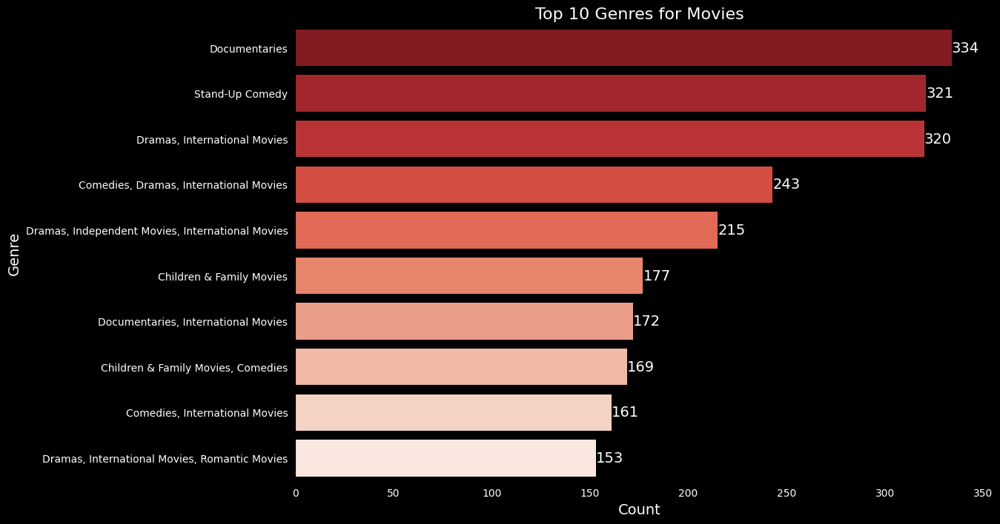

In [14]:
top_10_genre_movie = df['category'][df['type'] == 'Movie'].value_counts().sort_values(ascending=False).iloc[:10]

plt.figure(figsize=(12, 8), facecolor='black')  
sns.barplot(x=top_10_genre_movie.values, y=top_10_genre_movie.index,hue=top_10_genre_movie.index, palette='Reds_r') 

plt.title('Top 10 Genres for Movies', fontsize=16, color='white')  
plt.xlabel('Count', fontsize=14, color='white')  
plt.ylabel('Genre', fontsize=14, color='white')  
plt.xticks(color='white')  
plt.yticks(color='white')  
plt.gca().set_facecolor('black')

for i, count in enumerate(top_10_genre_movie):
    plt.text(count, i, str(count), ha='left', va='center', color='white', fontsize=14)
plt.show()

The chart shows top 10 Movie Genres, with 'Documentries' at top with 334 followed by 'Stand-up-Comedies' & 'Drama-International Movies' with 321 movie count. After that movie count of Genre goes on decreasing.

### Top TV Show Generes:

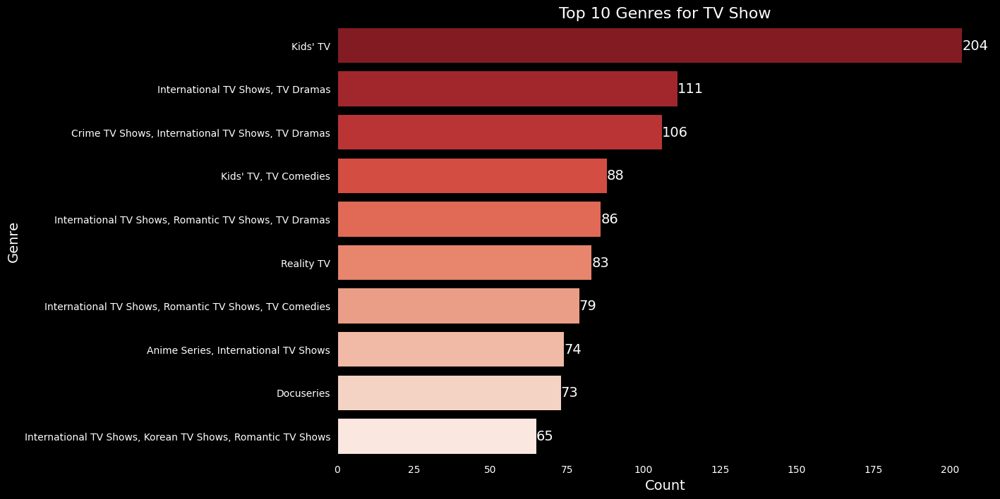

In [57]:
top_10_category_tvshow = df['category'][df['type'] == 'TV Show'].value_counts().sort_values(ascending=False).iloc[:10]

plt.figure(figsize=(12, 8), facecolor='black')  
sns.barplot(x=top_10_category_tvshow.values, y=top_10_category_tvshow.index,hue=top_10_category_tvshow.index, palette='Reds_r') 

plt.title('Top 10 Genres for TV Show', fontsize=16, color='white')  
plt.xlabel('Count', fontsize=14, color='white')  
plt.ylabel('Genre', fontsize=14, color='white')  
plt.xticks(color='white')  
plt.yticks(color='white')  
plt.gca().set_facecolor('black')

for i, count in enumerate(top_10_category_tvshow):
    plt.text(count, i, str(count), ha='left', va='center', color='white', fontsize=14)
plt.show()

The chart shows top 10 Tv Show Genres, with 'Kid's TV' at top with 204 count followed by 'International-Shows','TV-Drama' &'TV-crime' with count of 111 & 106. After that shows count of Genre goes on decreasing.

# Question 10
### Top directors in each country:

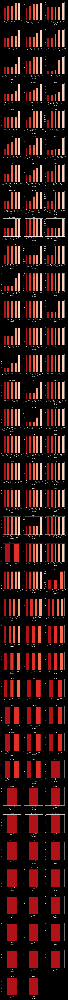

In [58]:
df_fltr = df[~df.country.isna() & ~df.director.isna()]
df_fltr = df_fltr.assign(country=df_fltr['country'].str.strip(',').str.replace(', ', ',').str.split(',')).explode('country').reset_index(drop=True)
df_fltr = df_fltr.assign(director=df_fltr['director'].str.strip().str.split(', ')).explode('director').reset_index(drop=True)

df_movies = df_fltr[(df_fltr['type'] == 'Movie') & (~df_fltr['country'].isna()) & (~df_fltr['director'].isna())]
df_movies = df_movies[df_movies['director'] != 'Unavailable']

countries_with_movies = df_movies['country'].value_counts().keys().tolist()
fig = plt.figure(figsize=(15, 250),facecolor='black')

for idx, country in enumerate(countries_with_movies):
    ax = fig.add_subplot(38, 3, idx + 1)
    
    result = df_movies.loc[(df_movies['country'] == country) & (df_movies['director'] != 'Unavailable')]['director'].value_counts().sort_values().tail(5)
    result.plot.bar(color=sns.color_palette('Reds_r',n_colors=5), rot=0)
    
    ax.set_title(country, fontsize=12,color='white')
    ax.set_xlabel('Directors', fontsize=12, color='white')
    ax.set_facecolor('black')
    ax.tick_params(axis='x',labelrotation=20, colors='white') 
    ax.tick_params(axis='y', colors='white')
    for spine in ax.spines.values():
        spine.set_edgecolor('white')     
    
plt.subplots_adjust(hspace=0.5)
plt.show()

# Question 11

### Top directors of Movies:

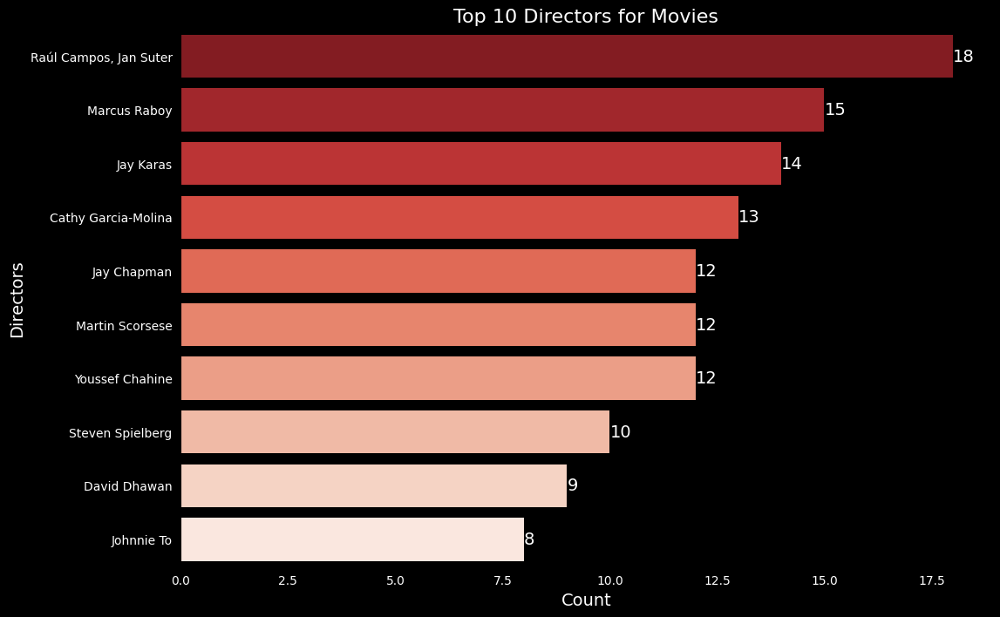

In [64]:
movies_with_directors = df.loc[(df['type'] == 'Movie') & (df['director'] != 'Unavailable')]
top_10_directors_movie = movies_with_directors['director'].value_counts().head(10)

plt.figure(figsize=(12, 8), facecolor='black')
sns.barplot(x=top_10_directors_movie.values, y=top_10_directors_movie.index, hue=top_10_directors_movie.index, palette='Reds_r', orient='h', legend=False)

plt.title('Top 10 Directors for Movies', fontsize=16, color='white')
plt.xlabel('Count', fontsize=14, color='white')
plt.ylabel('Directors', fontsize=14, color='white')
plt.xticks(color='white')
plt.yticks(color='white')
plt.gca().set_facecolor('black')

for i, count in enumerate(top_10_directors_movie):
    plt.text(count, i, str(count), ha='left', va='center', color='white', fontsize=14)

plt.show()

As the chart show 'Raul Jan Suter' is leading director with 18 movies directed, after that 'Marcus Raboy' comes on second place with 15 movies & 'Jay Karas' on third with 14 movies & followed by others.

### Top directors of TV Shows:

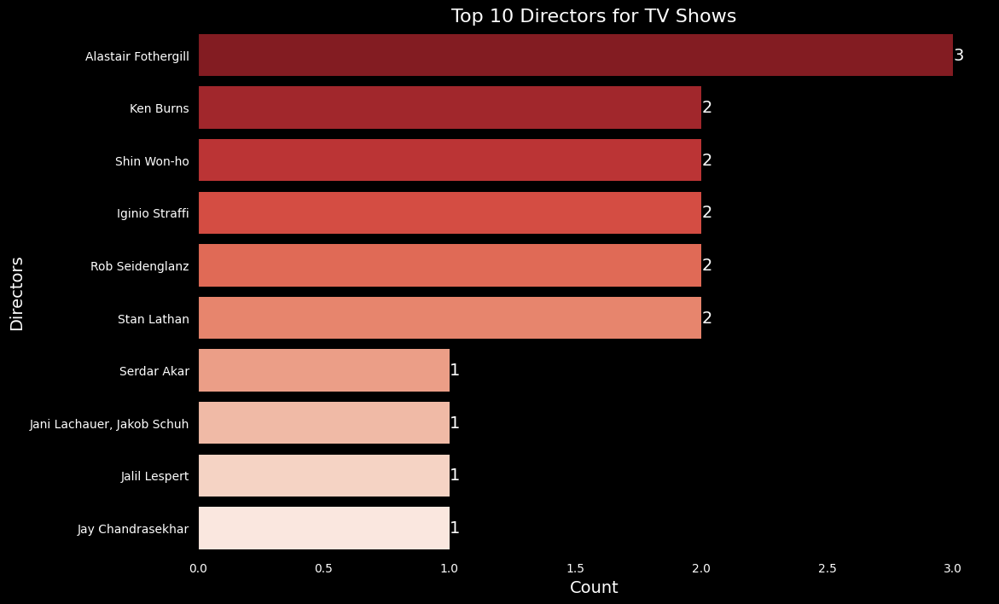

In [65]:
TV_Shows_with_directors = df.loc[(df['type'] == 'TV Show') & (df['director'] != 'Unavailable')]

top_10_directors_TVShow = TV_Shows_with_directors['director'].value_counts().head(10)
plt.figure(figsize=(12, 8), facecolor='black')
sns.barplot(x=top_10_directors_TVShow.values, y=top_10_directors_TVShow.index, hue=top_10_directors_TVShow.index, palette='Reds_r', orient='h', legend=False)

plt.title('Top 10 Directors for TV Shows', fontsize=16, color='white')
plt.xlabel('Count', fontsize=14, color='white')
plt.ylabel('Directors', fontsize=14, color='white')
plt.xticks(color='white')
plt.yticks(color='white')
plt.gca().set_facecolor('black')

for i, count in enumerate(top_10_directors_TVShow):
    plt.text(count, i, str(count), ha='left', va='center', color='white', fontsize=14)
plt.show()

As the chart show 'Alastair Fothergill' is leading director with 3 TV Shows directed.

# Question 12
### Duration range for movies:


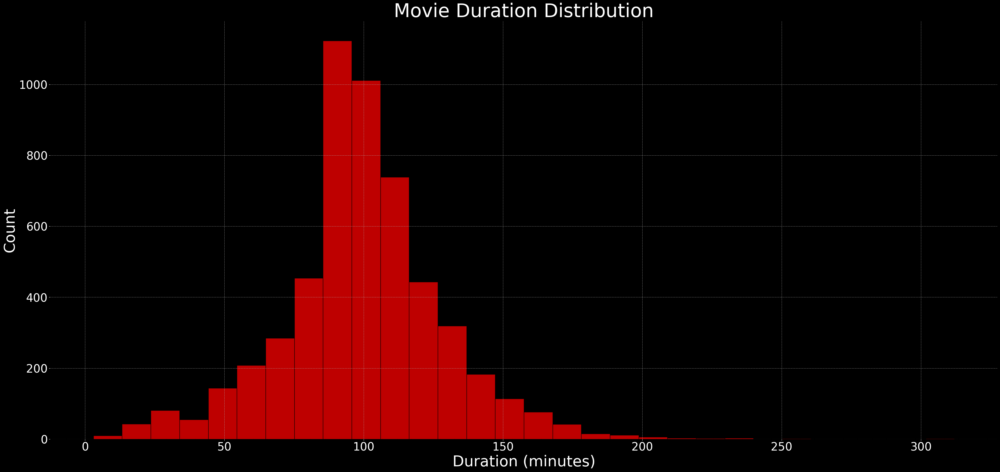

In [146]:
movie_df = df[df['type'] == 'Movie'].copy()
movie_df['duration'] = movie_df['duration'].str.replace("min", "").str.strip()
movie_df['duration'] = movie_df['duration'].astype(int)
movie_df = movie_df[movie_df['duration'] > 1]

plt.figure(figsize=(45, 20), facecolor='black')
ax = sns.histplot(x='duration', data=movie_df, bins=30, color='red')

ax.set_xlabel('Duration (minutes)', fontsize=40, color='white')
ax.set_ylabel('Count', fontsize=40, color='white')
ax.tick_params(axis='x', colors='white', labelsize=30)
ax.tick_params(axis='y', colors='white', labelsize=30)

ax.set_title('Movie Duration Distribution', fontsize=50, color='white')
ax.set_facecolor('black')

plt.grid(axis='x', linestyle='--', alpha=0.7)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

As observed, the duration range for movies falls between 90 and 100 minutes.

### Duration range for TV Shows:

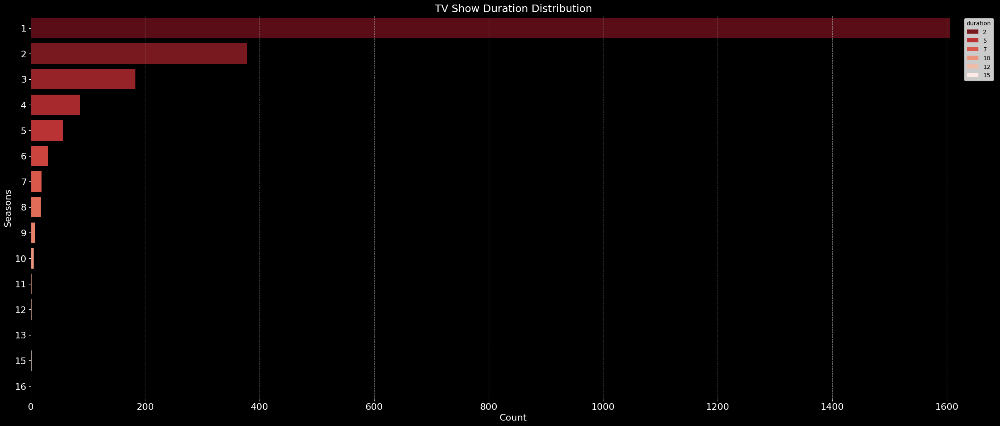

In [29]:
tv_show = (df['type'] == 'TV Show')
tvdf = df[tv_show].copy()

tvdf['duration'] = tvdf['duration'].str.replace("Seasons"," ").str.replace("Season"," ").str.strip()
tvdf['duration'] = tvdf['duration'].astype('int32')

plt.figure(figsize=(30,12),facecolor='black')
ax = sns.countplot(y=tvdf['duration'], data=tvdf,hue=tvdf['duration'],palette='Reds_r')

ax.set_ylabel('Seasons', fontsize=16, color='white')
ax.set_xlabel('Count', fontsize=16, color='white')
ax.tick_params(axis='x', colors='white', labelsize=16)
ax.tick_params(axis='y', colors='white', labelsize=16)

ax.set_title('TV Show Duration Distribution', fontsize=18, color='white')
ax.set_facecolor('black')
plt.grid(axis='x', linestyle='--', alpha=0.7)

plt.show()

In [32]:
movie_df[['duration','title']].sort_values(by='duration',ascending=False).head()

,duration,title
7194,99 min,Tremors 5: Bloodline
7540,99 min,What Keeps You Alive
5193,99 min,Rim of the World
7026,99 min,Thi Mai
2987,99 min,Indiscretion


As it shows all these movies have highest duration of 99 minutes.

In [33]:
tvshow_df[['duration','title']].sort_values(by='duration', ascending =False).head()

,duration,title
1428,9 Seasons,Club Friday The Series 6
4389,9 Seasons,Naruto
1178,9 Seasons,Call the Midwife
6966,9 Seasons,The Walking Dead
6701,9 Seasons,The Office (U.S.)


'Club Friday The Series-6' has 9 Seasons, highest duration of show among all.